In [1]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tensorflow.keras import Model, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
from tensorflow.keras.layers import LayerNormalization, BatchNormalization
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping
from tensorflow.keras.utils import custom_object_scope
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import statistics

In [2]:
PATH_HAZE = '/kaggle/input/haze1k/Distributed_haze1k/'
PATH = PATH_HAZE

In [3]:
BATCH_SIZE = 4
image_shape = (256,256,3)

In [ ]:
def load_image(image_path):
    '''Load and preprocess the image'''
    img = tf.io.read_file(image_path)
    img = tf.io.decode_png(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    img = (img / 127.5) - 1.0  # Normalize to [-1, 1]
    return img

def load_paired_data(real_image_path, fake_image_path):
    '''Load paired input-target images and apply augmentations'''
    real_image = load_image(real_image_path)
    fake_image = load_image(fake_image_path)

    # Random horizontal flip
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
        fake_image = tf.image.flip_left_right(fake_image)

    # Random vertical flip (upside down)
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_up_down(real_image)
        fake_image = tf.image.flip_up_down(fake_image)

    # Random 180-degree rotation
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.rot90(real_image, k=2)
        fake_image = tf.image.rot90(fake_image, k=2)

    return real_image, fake_image


In [5]:
def load_dataset(PATH, test_ds=False, validation_split=False):
    haze_images_paths = os.listdir(PATH + 'input')
    haze_images_paths = [PATH + 'input/' + item for item in haze_images_paths]
    haze_images_paths.sort()

    clear_images_paths = os.listdir(PATH + 'target')
    clear_images_paths = [PATH + 'target/' + item for item in clear_images_paths]
    clear_images_paths.sort()

    dataset = tf.data.Dataset.from_tensor_slices((haze_images_paths, clear_images_paths))
    dataset = dataset.map(load_paired_data, num_parallel_calls=tf.data.AUTOTUNE)

    # === Upsample dataset by adding 500 more augmented samples ===
    def augment_more(real, fake):
        if tf.random.uniform(()) > 0.5:
            real = tf.image.flip_left_right(real)
            fake = tf.image.flip_left_right(fake)
        if tf.random.uniform(()) > 0.5:
            real = tf.image.flip_up_down(real)
            fake = tf.image.flip_up_down(fake)
        if tf.random.uniform(()) > 0.5:
            real = tf.image.rot90(real, k=2)
            fake = tf.image.rot90(fake, k=2)
        return real, fake

    aug_dataset = dataset.take(250).map(augment_more, num_parallel_calls=tf.data.AUTOTUNE)

    # Combine original and augmented
    dataset = dataset.concatenate(aug_dataset)

    # Shuffle and prefetch
    dataset = dataset.shuffle(buffer_size=2048)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    # Handle test set
    if test_ds:
        dataset = dataset.batch(1)
        return dataset

    dataset = dataset.batch(BATCH_SIZE)
    return dataset

In [6]:
train_ds_full = load_dataset(PATH + 'train/')

In [7]:
print(len(train_ds_full))

288


In [8]:
moderate_test_ds = load_dataset(PATH + 'test_moderate/', test_ds=True)
thick_test_ds = load_dataset(PATH + 'test_thick/', test_ds=True)
thin_test_ds = load_dataset(PATH + 'test_thin/', test_ds=True)

In [9]:
print(len(moderate_test_ds))

90


In [10]:
train_ds = load_dataset(PATH + 'train/')

In [11]:
def subplot(img1, img2, title1, title2):
    fig, axes = plt.subplots(nrows=1, ncols=2)
    img1 = (img1[0] + 1) / 2.0
    img2 = (img2[0] + 1) / 2.0

    axes[0].imshow(img1)
    axes[0].set_title(title1)
    axes[0].axis('off')

    axes[1].imshow(img2)
    axes[1].set_title(title2)
    axes[1].axis('off')
    plt.show()

(4, 256, 256, 3)


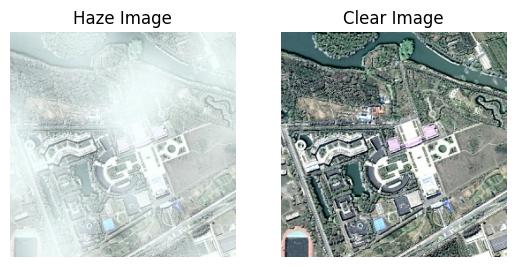

In [12]:
haze_image, clear_image  = next(iter(train_ds))
print(haze_image.shape)
subplot(haze_image, clear_image, 'Haze Image', 'Clear Image')

In [13]:
# Custom InstanceNormalization layer
class InstanceNormalization(layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(name='scale', shape=input_shape[-1:],
                                     initializer='ones', trainable=True)
        self.shift = self.add_weight(name='shift', shape=input_shape[-1:],
                                     initializer='zeros', trainable=True)

    def call(self, inputs, training=False):
        mean = tf.reduce_mean(inputs, axis=[1, 2], keepdims=True)
        variance = tf.reduce_mean(tf.square(inputs - mean), axis=[1, 2], keepdims=True)
        normalized = (inputs - mean) / tf.sqrt(variance + self.epsilon)
        return self.scale * normalized + self.shift

In [14]:
class MBConvBlock(layers.Layer):
    def __init__(self, filters, expansion_factor=6, kernel_size=3, stride=1, se_ratio=0.25, drop_rate=0.1):
        super(MBConvBlock, self).__init__()
        self.filters = filters
        self.expansion_factor = expansion_factor
        self.stride = stride
        self.se_ratio = se_ratio
        self.drop_rate = drop_rate

        self.expand_conv = layers.Conv2D(filters * expansion_factor, (1, 1), padding='same', use_bias=False)
        self.expand_bn = InstanceNormalization()
        self.expand_act = layers.Activation('swish')

        self.dw_conv = layers.DepthwiseConv2D(kernel_size, strides=stride, padding='same', use_bias=False)
        self.dw_bn = InstanceNormalization()
        self.dw_act = layers.Activation('swish')

        if 0 < se_ratio <= 1:
            se_filters = max(1, int(filters * expansion_factor * se_ratio))
            self.se_reduce = layers.Conv2D(se_filters, (1, 1), padding='same', activation='swish')
            self.se_expand = layers.Conv2D(filters * expansion_factor, (1, 1), padding='same', activation='sigmoid')
        else:
            self.se_reduce = None
            self.se_expand = None

        self.project_conv = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False)
        self.project_bn = InstanceNormalization()

        self.dropout = layers.Dropout(drop_rate) if drop_rate > 0 else None
        self.use_residual = (stride == 1)

    def call(self, inputs, training=False):
        x = inputs
        x = self.expand_conv(x)
        x = self.expand_bn(x, training=training)
        x = self.expand_act(x)

        x = self.dw_conv(x)
        x = self.dw_bn(x, training=training)
        x = self.dw_act(x)

        if self.se_ratio > 0:
            se = tf.reduce_mean(x, [1, 2], keepdims=True)
            se = self.se_reduce(se)
            se = self.se_expand(se)
            x = x * se

        x = self.project_conv(x)
        x = self.project_bn(x, training=training)

        if self.dropout and training:
            x = self.dropout(x)

        if self.use_residual and x.shape[-1] == inputs.shape[-1]:
            x = layers.Add()([x, inputs])

        return x

In [ ]:
class Generator(Model):
    def __init__(self, **kwargs):
        super(Generator, self).__init__()
        
        self.init = tf.keras.initializers.RandomNormal(stddev=0.02, seed=123)
        
        self.conv1 = layers.Conv2D(32, (3, 3), activation='swish', padding='same')
        self.conv2 = layers.Conv2D(32, (3, 3), activation='swish', padding='same')
        self.pool1 = layers.MaxPooling2D(pool_size=(2, 2))
        
        self.conv3 = layers.Conv2D(64, (3, 3), activation='swish', padding='same')
        self.conv4 = layers.Conv2D(64, (3, 3), activation='swish', padding='same')
        self.pool2 = layers.MaxPooling2D(pool_size=(2, 2))

        self.conv5 = layers.Conv2D(128, (3, 3), activation='swish', padding='same')
        self.conv6 = layers.Conv2D(128, (3, 3), activation='swish', padding='same')
        self.pool3 = layers.MaxPooling2D(pool_size=(2, 2))

        self.conv7 = layers.Conv2D(256, (3, 3), activation='swish', padding='same')
        self.conv8 = layers.Conv2D(256, (3, 3), activation='swish', padding='same')
        self.pool4 = layers.MaxPooling2D(pool_size=(2, 2))

        self.conv9 = layers.Conv2D(512, (3, 3), activation='swish', padding='same')
        self.conv10 = layers.Conv2D(512, (3, 3), activation='swish', padding='same')

        self.mb1 = MBConvBlock(filters=128, expansion_factor=6, stride=1)
        self.mb2 = MBConvBlock(filters=128, expansion_factor=6, stride=2)
        self.mb3 = MBConvBlock(filters=128, expansion_factor=6, stride=2)
        self.mb4 = MBConvBlock(filters=128, expansion_factor=6, stride=2)

        self.up6 = layers.Concatenate(axis=-1)
        self.conv11 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')
        self.conv12 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')

        self.up7 = layers.Concatenate(axis=-1)
        self.conv13 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')
        self.conv14 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')

        self.up8 = layers.Concatenate(axis=-1)
        self.conv15 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')
        self.conv16 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')

        self.up9 = layers.Concatenate(axis=-1)
        self.conv17 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')
        self.conv18 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')

        self.conv19 = layers.Conv2D(3, (1, 1), activation='tanh')
        
        self.convT1 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')
        self.convT2 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')
        self.convT3 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')
        self.convT4 = layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')
        
    def call(self, batch):
        conv1 = self.conv1(batch)
        conv1 = self.conv2(conv1)
        pool1 = self.pool1(conv1)

        conv2 = self.conv3(pool1)
        conv2 = self.conv4(conv2)
        pool2 = self.pool2(conv2)

        conv3 = self.conv5(pool2)
        conv3 = self.conv6(conv3)
        pool3 = self.pool3(conv3)
        
        conv4 = self.conv7(pool3)
        conv4 = self.conv8(conv4)
        pool4 = self.pool4(conv4)

        conv5 = self.conv9(pool4)
        conv5 = self.conv10(conv5)

        mb1 = self.mb1(batch)
        mb2 = self.mb2(mb1)
        mb3 = self.mb3(mb2)
        mb4 = self.mb4(mb3)

        up6 = self.up6([self.convT1(conv5), conv4, mb4])
        conv6 = self.conv11(up6)
        conv6 = self.conv12(conv6)

        up7 = self.up7([self.convT2(conv6), conv3, mb3])
        conv7 = self.conv13(up7)
        conv7 = self.conv14(conv7)

        up8 = self.up8([self.convT3(conv7), conv2, mb2])
        conv8 = self.conv15(up8)
        conv8 = self.conv16(conv8)

        up9 = self.up9([self.convT4(conv8), conv1, mb1])
        conv9 = self.conv17(up9)
        conv9 = self.conv18(conv9)

        conv10 = self.conv19(conv9)
        return conv10
    
    def build_summary(self, input_shape=image_shape):
        inp = Input(shape=input_shape)
        return Model(inputs=[inp], outputs=self.call(inp))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'mb_conv_block', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'mb_conv_block_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'mb_conv_block_2', however the layer

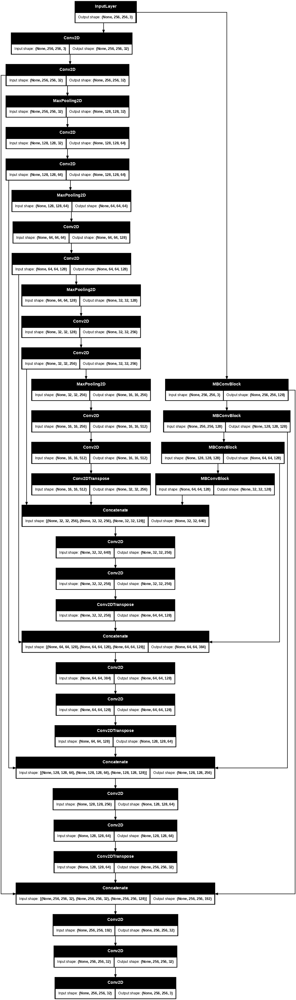

In [16]:
generator = Generator()
tf.keras.utils.plot_model(generator.build_summary(), show_shapes=True, dpi=64)

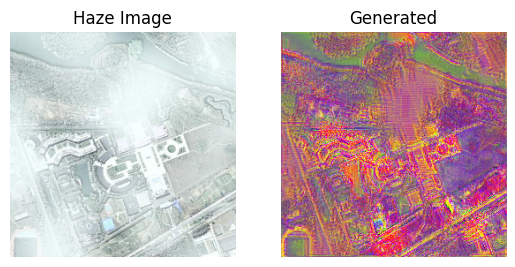

In [17]:
gen_output = generator(haze_image)
subplot(haze_image, gen_output, 'Haze Image', 'Generated')

In [18]:
def compute_haze_mask(input_image):
    image = (input_image + 1.0) * 0.5
    hsv = tf.image.rgb_to_hsv(image)
    v_channel = hsv[..., 2] 
    haze_mask = 1.0 - v_channel  # Invert brightness → thicker haze = higher value
    return tf.expand_dims(haze_mask, axis=-1) 


In [19]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg19 import preprocess_input

# Build VGG19 feature extractor model
def build_vgg_feature_extractor():
    vgg = VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    selected_layers = ['block1_conv2', 'block2_conv2', 'block3_conv3']
    outputs = [vgg.get_layer(name).output for name in selected_layers]
    model = Model(inputs=vgg.input, outputs=outputs)
    return model

vgg_model = build_vgg_feature_extractor()


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [20]:
def perceptual_loss(y_true, y_pred):
    # Resize to 224x224 for VGG19
    y_true = tf.image.resize(y_true, (224, 224))
    y_pred = tf.image.resize(y_pred, (224, 224))
    y_true = preprocess_input(y_true * 255.0)
    y_pred = preprocess_input(y_pred * 255.0)

    true_features = vgg_model(y_true)
    pred_features = vgg_model(y_pred)

    loss = 0
    for t_feat, p_feat in zip(true_features, pred_features):
        loss += tf.reduce_mean(tf.abs(t_feat - p_feat)) 
    return loss


In [ ]:
LAMBDA = 150
LAMBDA_PERCEPTUAL = 0.005  
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=False)

def charbonnier_loss(y_true, y_pred, epsilon=1e-3):
    return tf.reduce_mean(tf.sqrt(tf.square(y_true - y_pred) + tf.square(epsilon)))

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    haze_mask = compute_haze_mask(haze_mask)
    charb_loss = charbonnier_loss(target, gen_output)
    weighted_charb_loss = charbonnier_loss(target * haze_mask, gen_output * haze_mask)
    haze_aware_charb = 0.7 * charb_loss + 0.3 * weighted_charb_loss
    perc_loss = perceptual_loss(target, gen_output)
    total_gen_loss = gan_loss + (LAMBDA * haze_aware_charb) + (LAMBDA_PERCEPTUAL * perc_loss)
    return total_gen_loss, gan_loss, haze_aware_charb, perc_loss


In [22]:
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.initializers import RandomNormal

# Custom SpectralNormalization wrapper
class SpectralNormalization(layers.Layer):
    def __init__(self, layer, iteration=1):
        super(SpectralNormalization, self).__init__()
        self.layer = layer
        self.iteration = iteration

    def build(self, input_shape):
        self.layer.build(input_shape)
        self.w = self.layer.kernel
        self.w_shape = self.w.shape.as_list()
        self.u = self.add_weight(name='u', shape=(1, self.w_shape[-1]),
                                 initializer=tf.keras.initializers.RandomNormal(0, 1), trainable=False)

    def call(self, inputs, training=False):
        if training:
            w = tf.reshape(self.w, (-1, self.w_shape[-1]))
            u = self.u
            for _ in range(self.iteration):
                v = tf.nn.l2_normalize(tf.matmul(u, w, transpose_b=True))
                u = tf.nn.l2_normalize(tf.matmul(v, w))
            sigma = tf.matmul(tf.matmul(v, w), u, transpose_b=True)
            self.u.assign(u)
            w_norm = self.w / sigma
            self.layer.kernel.assign(w_norm)
        return self.layer(inputs)

In [23]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.init = tf.keras.initializers.RandomNormal(stddev=0.02, seed=123)
        
        self.concat = layers.Concatenate()
        
        self.conv1 = SpectralNormalization(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=self.init))
        self.leaky_relu1 = layers.LeakyReLU(alpha=0.2)
        
        self.conv2 = SpectralNormalization(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=self.init))
        self.leaky_relu2 = layers.LeakyReLU(alpha=0.2)
        
        self.conv3 = SpectralNormalization(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=self.init))
        self.leaky_relu3 = layers.LeakyReLU(alpha=0.2)
        
        self.conv4 = SpectralNormalization(layers.Conv2D(512, (4, 4), strides=(2, 2), padding='same', kernel_initializer=self.init))
        self.leaky_relu4 = layers.LeakyReLU(alpha=0.2)
        
        self.conv5 = SpectralNormalization(layers.Conv2D(512, (4, 4), padding='same', kernel_initializer=self.init))
        self.leaky_relu5 = layers.LeakyReLU(alpha=0.2)
        
        self.conv6 = SpectralNormalization(layers.Conv2D(1, (4, 4), padding='same', kernel_initializer=self.init))
        self.sigmoid = layers.Activation('sigmoid')
        
    def call(self, inp, tar):
        x = self.concat([inp, tar])
       
        x = self.conv1(x)
        x = self.leaky_relu1(x)
        
        x = self.conv2(x)
        x = self.leaky_relu2(x)
        
        x = self.conv3(x)
        x = self.leaky_relu3(x)
        
        x = self.conv4(x)
        x = self.leaky_relu4(x)
        
        x = self.conv5(x)
        x = self.leaky_relu5(x)
        
        x = self.conv6(x)
        patch_out = self.sigmoid(x)
        
        return patch_out
    
    def build_summary(self, input_shape=(256, 256, 3)):
        inp = Input(shape=input_shape)
        tar = Input(shape=input_shape)
        return Model(inputs=[inp, tar], outputs=self.call(inp, tar))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


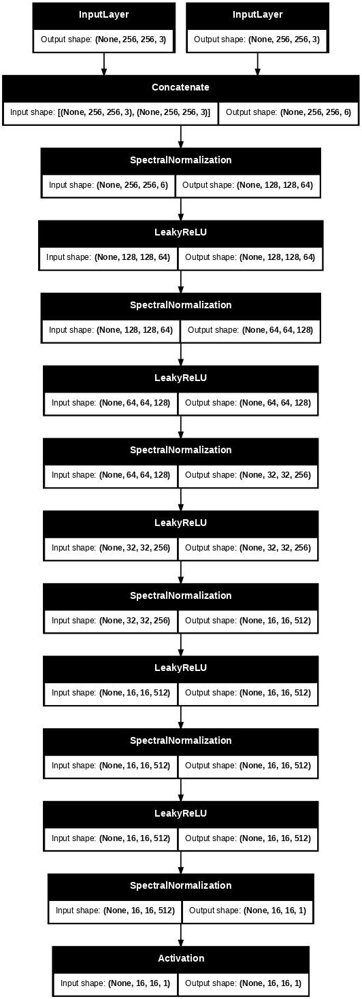

In [24]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator.build_summary(image_shape), show_shapes=True, dpi=64)

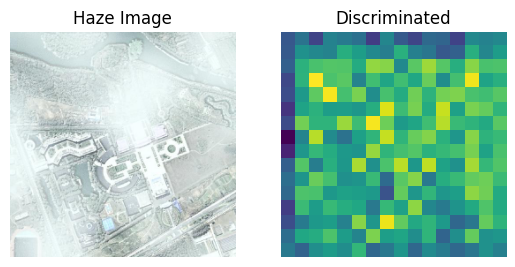

In [25]:
disc_output = discriminator(gen_output, haze_image)
subplot(haze_image, disc_output, 'Haze Image', 'Discriminated')

In [26]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5, beta_2=0.999)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.0, beta_2=0.9)

In [28]:
class GanGlaze(Model):
    def __init__(self, clear_generator, clear_discriminator):
        super(GanGlaze, self).__init__()
        self.c_gen = clear_generator
        self.c_disc = clear_discriminator
        
    def compile(self, c_gen_optimizer, c_disc_optimizer, gen_loss_fn, disc_loss_fn):
        super(GanGlaze, self).compile()
        self.c_gen_optimizer = c_gen_optimizer
        self.c_disc_optimizer = c_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        
    def train_step(self, batch_data):
        haze, clear = batch_data
    
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            gen_output = self.c_gen(haze, training=True)
    
            disc_real_output = self.c_disc(haze, clear, training=True)
            disc_generated_output = self.c_disc(haze, gen_output, training=True)
            
            gen_total_loss, gen_gan_loss, gen_l1_loss, gen_perceptual_loss = self.gen_loss_fn(disc_generated_output, gen_output, clear)
            disc_loss = self.disc_loss_fn(disc_real_output, disc_generated_output)
    
        generator_gradients = gen_tape.gradient(
            gen_total_loss, self.c_gen.trainable_variables
        )
        discriminator_gradients = disc_tape.gradient(
            disc_loss, self.c_disc.trainable_variables
        )
    
        self.c_gen_optimizer.apply_gradients(
            zip(generator_gradients, self.c_gen.trainable_variables)
        )
        self.c_disc_optimizer.apply_gradients(
            zip(discriminator_gradients, self.c_disc.trainable_variables)
        )
    
        return {
            'gen_total_loss': gen_total_loss,
            'gen_gan_loss': gen_gan_loss,
            'gen_l1_loss': gen_l1_loss,
            'gen_perceptual_loss': gen_perceptual_loss,
            'disc_loss': disc_loss   
        }

    def test_step(self, batch_data):
        haze, clear = batch_data
    
        gen_output = self.c_gen(haze, training=False)
    
        disc_real_output = self.c_disc(haze, clear, training=False)
        disc_generated_output = self.c_disc(haze, gen_output, training=False)
    
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_perceptual_loss = self.gen_loss_fn(disc_generated_output, gen_output, clear)
        disc_loss = self.disc_loss_fn(disc_real_output, disc_generated_output)
    
        return {
            'gen_total_loss': gen_total_loss,
            'gen_gan_loss': gen_gan_loss,
            'gen_l1_loss': gen_l1_loss,
            'gen_perceptual_loss': gen_perceptual_loss,
            'disc_loss': disc_loss   
        }

In [29]:
inp_img, tar_img = next(iter(moderate_test_ds))
def save_images(gen, test_input, name, step):
    pred_by_gen = gen(test_input)
    
    test_input = (test_input[0] + 1) / 2.0    
    pred_by_gen = (pred_by_gen[0] + 1) / 2.0
    
    plt.figure(figsize=(12, 12))

    display_list = [test_input, pred_by_gen]
    title = ['Input Image', 'Generated Image']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')
        
    filename = '%s_generated_plot_%06d.png' % (name, (step+1))
    plt.savefig(filename)
    plt.close()

In [30]:
class ReportCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 5 == 0:
            save_images(generator, inp_img, 'CtoH', epoch)

In [31]:
callbacks = [
    CSVLogger('/kaggle/working/training_res.csv'),
    ReportCallback(),
    # EarlyStopping(monitor='val_gen_total_loss', patience=10, restore_best_weights=True, verbose=1, mode='min')
]

In [32]:
GanGlaze_gan = GanGlaze(generator, discriminator)

GanGlaze_gan.compile(
    c_gen_optimizer=generator_optimizer,
    c_disc_optimizer=discriminator_optimizer,
    gen_loss_fn=generator_loss,
    disc_loss_fn=discriminator_loss
)

In [33]:
%%time
hist = GanGlaze_gan.fit(train_ds, epochs=200, batch_size=BATCH_SIZE, callbacks=callbacks, verbose=1)

Epoch 1/200
288/288 ━━━━━━━━━━━━━━━━━━━━ 189s 438ms/step - disc_loss: 1.3498 - gen_gan_loss: 0.7435 - gen_l1_loss: 0.1334 - gen_perceptual_loss: 453.3479 - gen_total_loss: 23.0191
Epoch 2/200
288/288 ━━━━━━━━━━━━━━━━━━━━ 108s 338ms/step - disc_loss: 1.3645 - gen_gan_loss: 0.7322 - gen_l1_loss: 0.1011 - gen_perceptual_loss: 350.5302 - gen_total_loss: 17.6508
Epoch 3/200
288/288 ━━━━━━━━━━━━━━━━━━━━ 107s 339ms/step - disc_loss: 1.3552 - gen_gan_loss: 0.7416 - gen_l1_loss: 0.0840 - gen_perceptual_loss: 314.6342 - gen_total_loss: 14.9140
Epoch 4/200
288/288 ━━━━━━━━━━━━━━━━━━━━ 107s 339ms/step - disc_loss: 1.3509 - gen_gan_loss: 0.7500 - gen_l1_loss: 0.0747 - gen_perceptual_loss: 292.6459 - gen_total_loss: 13.4254
Epoch 5/200
288/288 ━━━━━━━━━━━━━━━━━━━━ 108s 342ms/step - disc_loss: 1.3441 - gen_gan_loss: 0.7603 - gen_l1_loss: 0.0698 - gen_perceptual_loss: 279.1667 - gen_total_loss: 12.6248
Epoch 6/200
288/288 ━━━━━━━━━━━━━━━━━━━━ 107s 339ms/step - disc_loss: 1.3416 - gen_gan_loss: 0.7627 

In [34]:
# def plot_training_history(history):
#     # Extract metrics
#     gen_total_loss = history.history['gen_total_loss']
#     val_gen_total_loss = history.history['val_gen_total_loss']
#     disc_loss = history.history['disc_loss']
#     val_disc_loss = history.history['val_disc_loss']
#     gen_gan_loss = history.history['gen_gan_loss']
#     val_gen_gan_loss = history.history['val_gen_gan_loss']
#     gen_l1_loss = history.history['gen_l1_loss']
#     val_gen_l1_loss = history.history['val_gen_l1_loss']
#     gen_perceptual_loss = history.history['gen_perceptual_loss']
#     val_gen_perceptual_loss = history.history['val_gen_perceptual_loss']

#     epochs = range(1, len(gen_total_loss) + 1)

#     plt.figure(figsize=(18, 12))

#     # Generator Total Loss
#     plt.subplot(2, 2, 1)
#     plt.plot(epochs, gen_total_loss, 'b-', label='Train Gen Total')
#     plt.plot(epochs, val_gen_total_loss, 'r-', label='Val Gen Total')
#     plt.title('Generator Total Loss')
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.grid(True)

#     # Discriminator Loss
#     plt.subplot(2, 2, 2)
#     plt.plot(epochs, disc_loss, 'b-', label='Train Disc')
#     plt.plot(epochs, val_disc_loss, 'r-', label='Val Disc')
#     plt.title('Discriminator Loss')
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.grid(True)

#     # Generator L1 + Perceptual Loss
#     plt.subplot(2, 2, 3)
#     plt.plot(epochs, gen_l1_loss, 'g-', label='Train L1 Loss')
#     plt.plot(epochs, val_gen_l1_loss, 'lime', label='Val L1 Loss')
#     plt.plot(epochs, gen_perceptual_loss, 'c-', label='Train Perceptual Loss')
#     plt.plot(epochs, val_gen_perceptual_loss, 'teal', label='Val Perceptual Loss')
#     plt.title('L1 + Perceptual Loss')
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.grid(True)

#     # Generator GAN Loss
#     plt.subplot(2, 2, 4)
#     plt.plot(epochs, gen_gan_loss, 'm-', label='Train GAN Loss')
#     plt.plot(epochs, val_gen_gan_loss, 'orange', label='Val GAN Loss')
#     plt.title('Generator GAN Loss')
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.grid(True)

#     plt.tight_layout()
#     plt.show()


In [35]:
# plot_training_history(hist)

In [36]:
generator.save('generator_model.keras')

# Load the generator
with custom_object_scope({
    'InstanceNormalization': InstanceNormalization,
    'MBConvBlock': MBConvBlock,
    'Generator': Generator,
    'SpectralNormalization': SpectralNormalization,
    'Discriminator': Discriminator,
    'GanGlaze': GanGlaze
}):
    loaded_generator = tf.keras.models.load_model('generator_model.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'mb_conv_block_4', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'mb_conv_block_5', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'mb_conv_block_6', however the lay

In [37]:
ssim_list = []
psnr_list = []

def ssim_evaluation(img1, img2):
    ssim_value = ssim(img1, img2, channel_axis=2, data_range=img2.max() - img2.min())
    ssim_list.append(ssim_value)
    
def psnr_evaluation(img1, img2):
    psnr_value = psnr(img1, img2)
    psnr_list.append(psnr_value)

In [38]:
def evaluate_model(model, inp, tar, sno):
    pred = model(inp, training=True)
    plt.figure(figsize=(15, 15))
    
    inp = inp[0].numpy()
    inp = (inp + 1) / 2.0
    tar = tar[0].numpy()
    tar = (tar + 1) / 2.0
    pred = pred[0].numpy()
    pred = (pred + 1) / 2.0
    
    # SSIM
    ssim_curr = ssim_evaluation(tar, pred)
    
    # PSNR
    psnr_curr = psnr_evaluation(tar, pred)
    
    display_list = [inp, tar, pred]
    title = ['Haze Image', 'Ground Truth', 'Predicted Image']
   
    if sno <= 5:
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i])
            plt.axis('off')
        plt.show()
    plt.close()

In [39]:
skeleton = {
        'SSIM': [],
        'PSNR': []
}

In [40]:
def evaluate_test(test_ds, name):
    for i, (inp, tar) in test_ds.take(len(test_ds)).enumerate():
        evaluate_model(loaded_generator, inp, tar, i)
        
    ssim_mean = statistics.mean(ssim_list)
    psnr_mean = statistics.mean(psnr_list)
    
    print('Dataset-{}'.format(name))
    print(ssim_mean)
    print(psnr_mean)
    
    skeleton['SSIM'].append(ssim_mean)
    skeleton['PSNR'].append(psnr_mean)
        
    ssim_list.clear()
    psnr_list.clear()

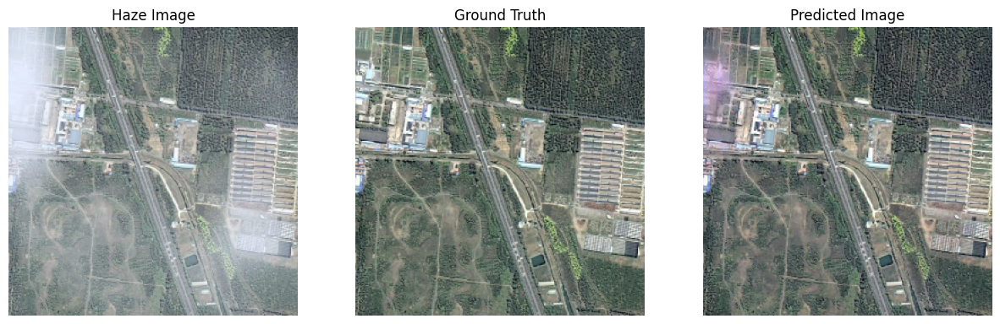

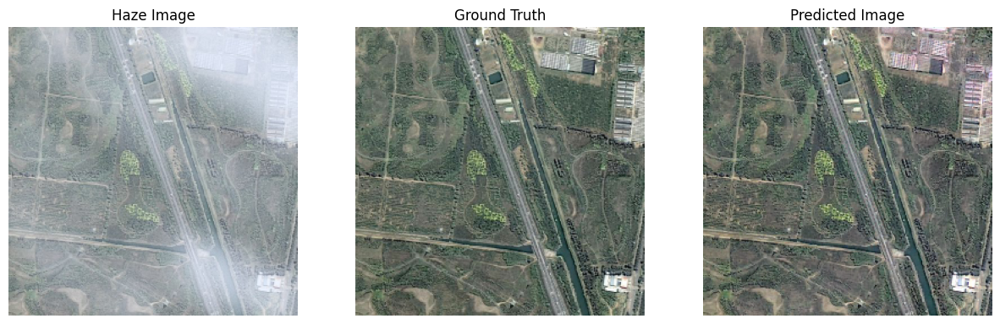

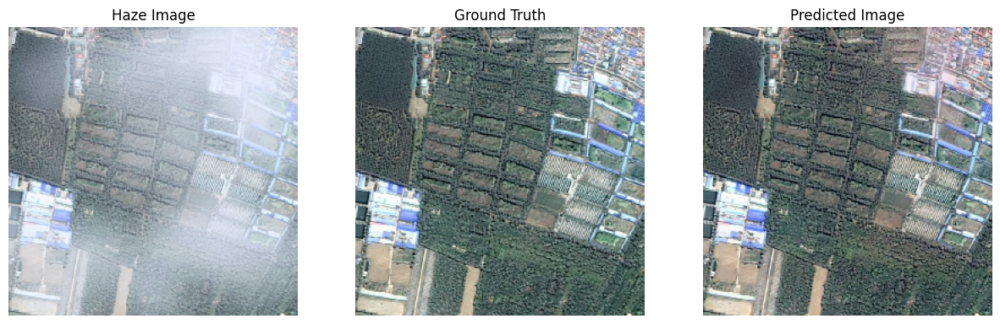

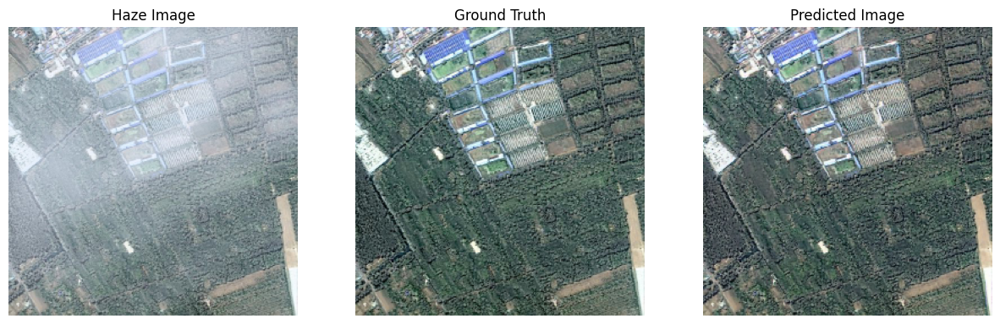

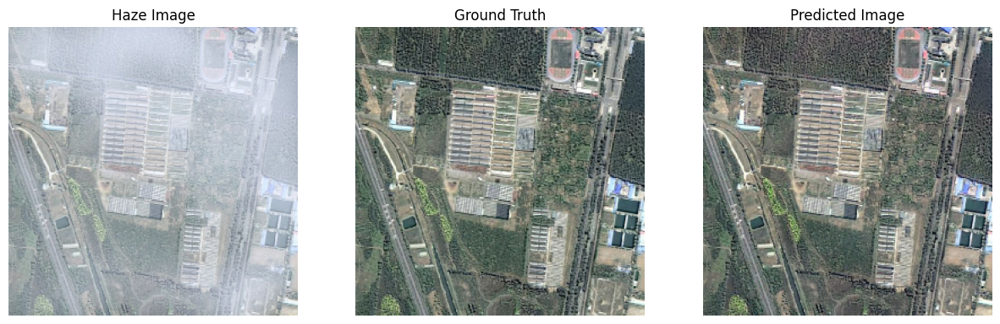

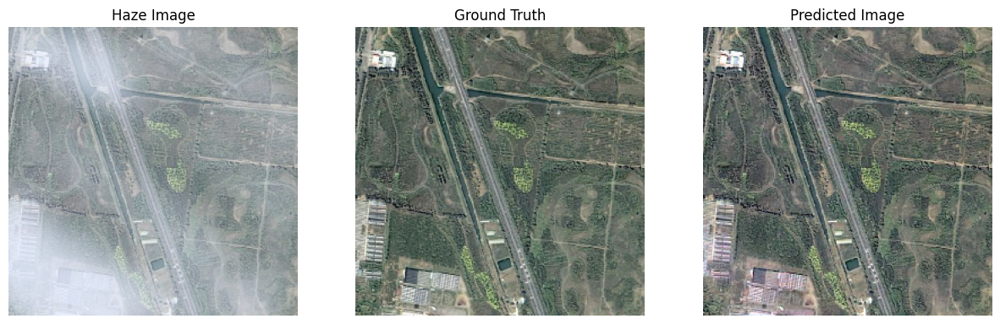

Dataset-Moderate
0.96415305
29.467709099549534


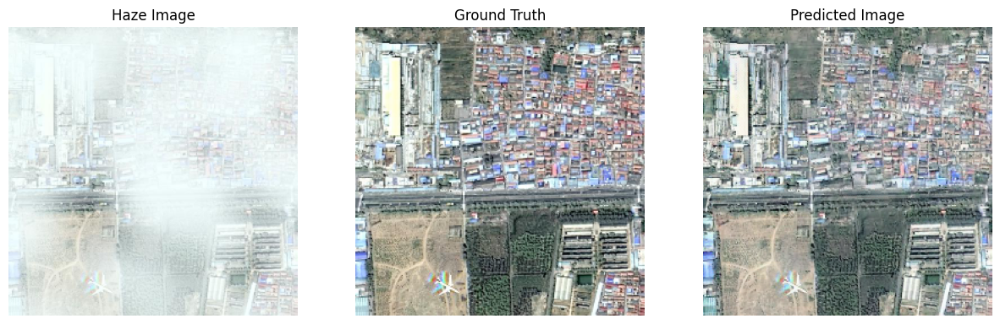

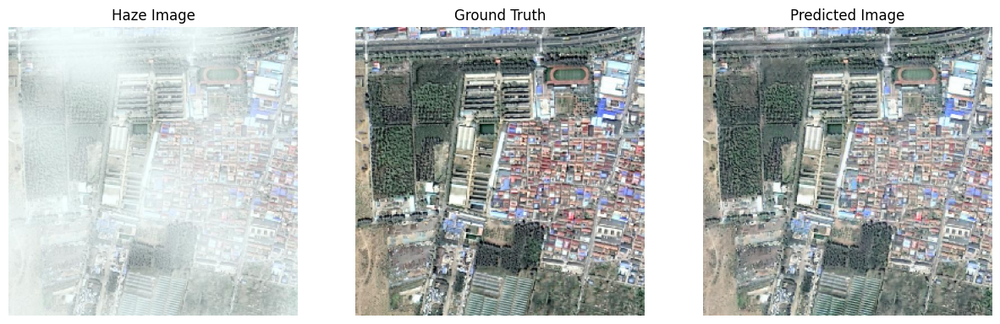

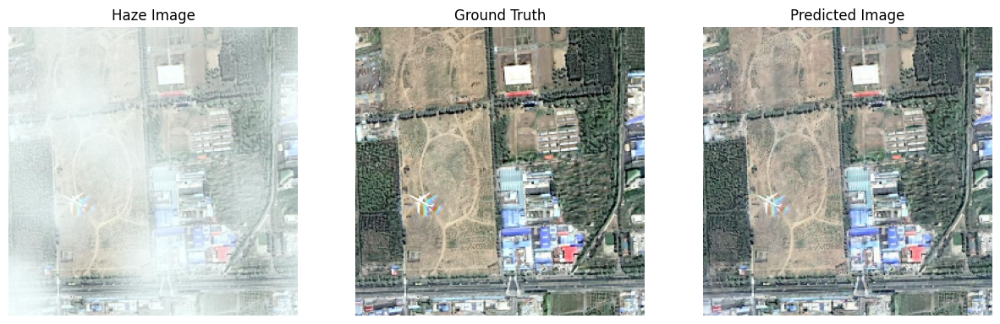

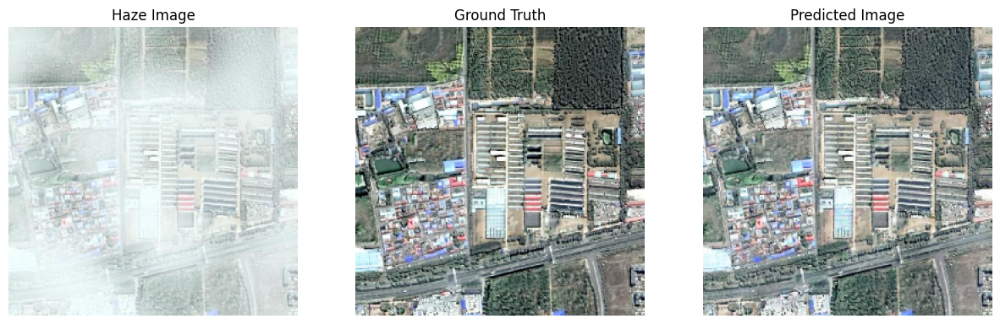

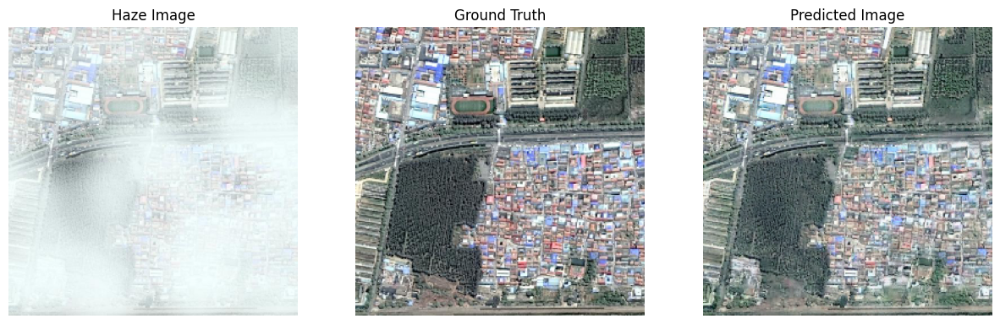

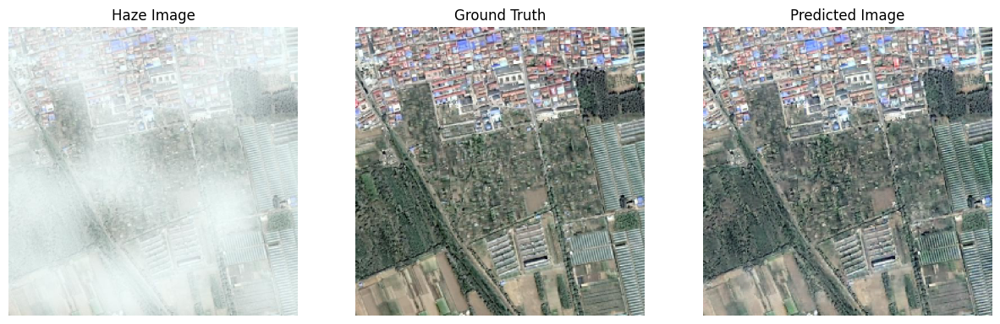

Dataset-Thick
0.92658895
23.53342199785156


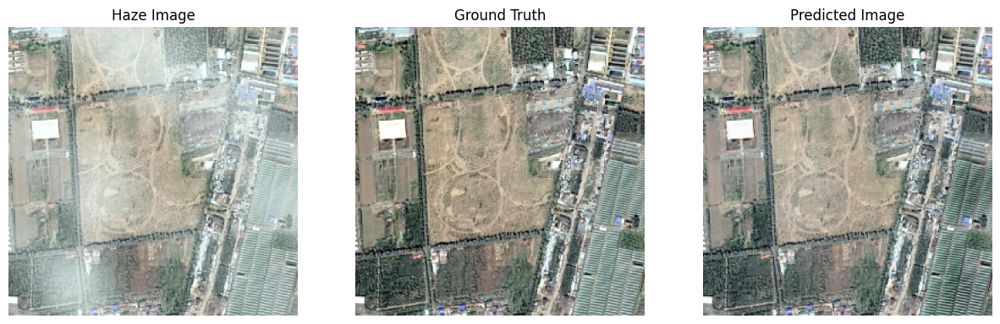

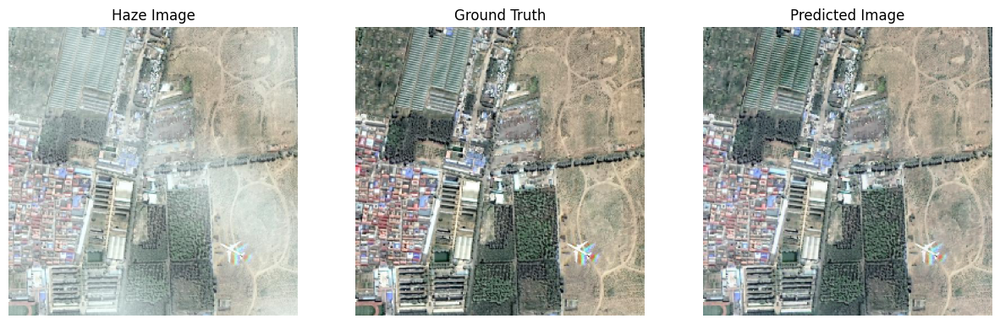

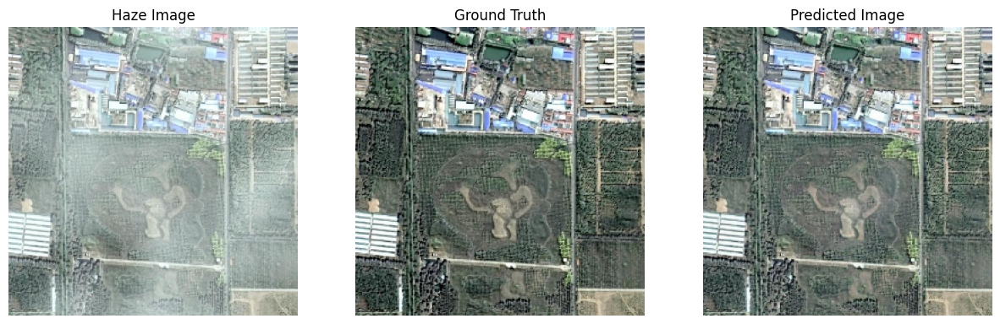

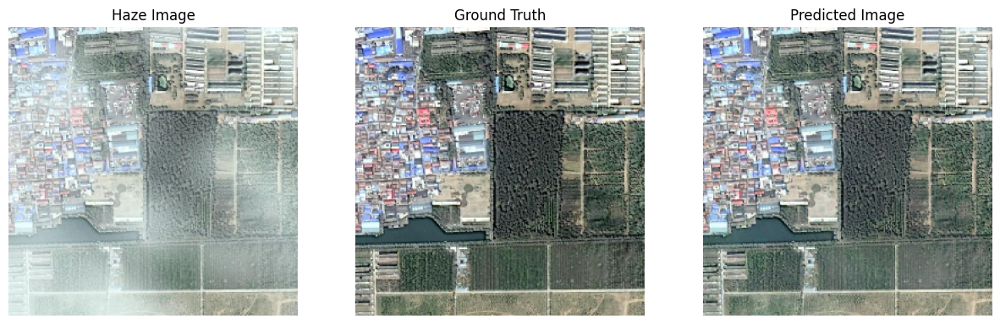

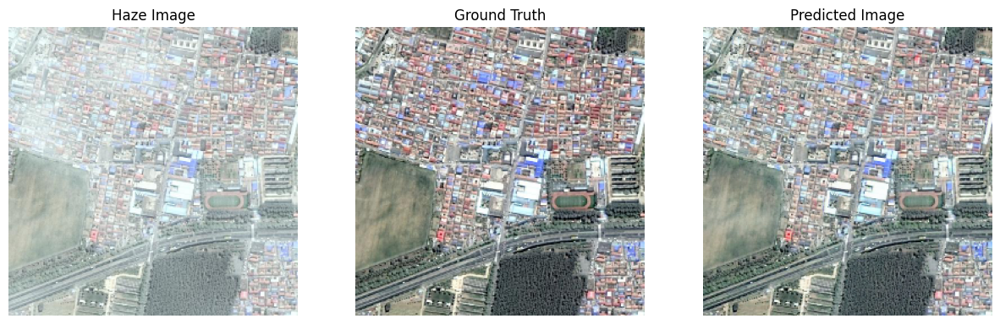

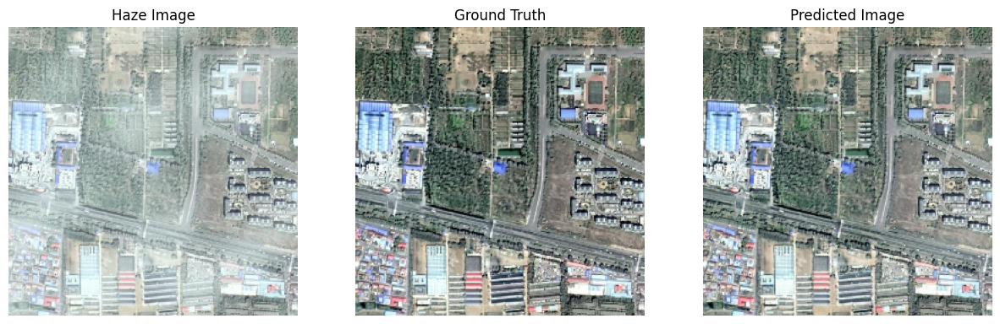

Dataset-Thin
0.96014386
25.392449642263916


In [41]:
evaluate_test(moderate_test_ds, 'Moderate')
evaluate_test(thick_test_ds, 'Thick')
evaluate_test(thin_test_ds, 'Thin')